<div style="background-color:#182A39; color:#00BCFE; padding:5px">
<div style="background-color:#1A2331; padding:10px"; align="center">

# <span style="color:#E28200;">___Разведочный анализ данных видеоигр на сайте Metacritic___</span>

</div>

## <br><span style="padding:15px">__Coдержание__<span>

- [<span style="color:#E28200;">___Описание исследуемого набора данных___<span>](#Описание-исследуемого-набора-данных)
  
- [<span style="color:#E28200;">___Ключевые задачи___<span>](#Ключевые-задачи)
    1. [**Чтение и предобработка данных**](#1.-Чтение-и-предобработка-данных)
    2. [**Описательная статистика переменных**](#2.-Описательная-статистика-переменных)
    3. [**Целевой признак и взаимосвязи с ним**](#3.-Целевой-признак-и-взаимосвязи-с-ним)
   
<br><br>
     
# [**README проекта-->**](https://github.com/IvanoVladimir/karpov_courses/blob/main/SQL_project/README.md 'Ссылка на описание проекта')

</ul></br>

---

</div>

<div style="background-color:#182A39; color:#00BCFE; padding:5px">

<div style="background-color:#1A2331; padding:10px"; align="center">

## [<span style="color:#E28200">___Описание исследуемого набора данных___<span>](#Разведочный-анализ-данных-видеоигр-на-сайте-Metacritic)</br>

</div>
    
<ul><br>

🎮 _Набор данных содержит видеоигры, которые были представлены на сайте Metacritic с 1995 по январь 2024 года, включает более 14 000 игр для всех платформ и жанров._ 🕹️

<br><span style="color:#E28200;">___Исследуемые признаки :___</span><br>

**`Title`** — название игры

**`Release Date`** — дата релиза

**`Developer`** — разработчик

**`Publisher`** — издатель

**`Genres`** — жанры

**`Publisher`** — издатель

**`Product Rating`** — возрастной рейтинг

**`User Score`** — средняя оценка пользователелей(<span style="color:#E28200;">___целевой признак___</span>)

**`User Ratings Count`** — количество оценок пользователелей

**`Platforms Info`** — словарь с дополнительной информацией

<br><span style="color:#E28200;">___Ссылка на датасет :___</span><br>

 [**Video Games Dataset**](https://www.kaggle.com/datasets/beridzeg45/video-games/data)

</ul></br>

---
</div>

<div style="background-color:#182A39; color:#00BCFE; padding:5px">

<div style="background-color:#1A2331; padding:10px"; align="center">

## [<span style="color:#E28200">___Ключевые задачи___<span>](#Разведочный-анализ-данных-видеоигр-на-сайте-Metacritic)</br>

</div>

<ul><br>

<span style="color:#E28200">___В рамках EDA произвести следующие операции :___</span>

1. ___Чтение и предобработку набора данных ;___

2. ___Сделать описательную статистику переменных ;___

3. ___Найти и показать взаимосвязи целевого признака с остальными;___

</ul></br>

---
</div>

<div style="background-color:#182A39; color:#00BFDD; padding:5px">

<div style="background-color:#1A2331; padding:10px"; align="center">

## [<span style="color:#E28200">___1. Чтение и предобработка данных___<span>](#Разведочный-анализ-данных-видеоигр-на-сайте-Metacritic)</br>

</div>

<br>
    
>_На текущем этапе посмотрим основную инфомацию, включая наличие пропусков, дубликатов, валидность значений, и произведём все необходимые предобработки и преобразования. Также попробуем вытащить дополнительную информацию из столбца **Platforms Info**, в которой могут быть полезные данные._

</br>

---
</div>

In [1]:
import os
import re
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from phik.report import plot_correlation_matrix
from plotly.subplots import make_subplots

# Для избежания ошибки при построении матрицы диаграммы рассеяния.
pd.DataFrame.iteritems = pd.DataFrame.items 

In [2]:
path_files = [rf'{os.getcwd()}\{name}' for name in os.listdir() if name.endswith('csv')]

In [3]:
data = dict([(f.split('\\')[-1].replace('.csv', ''), pd.read_csv(f)) for f in path_files])

In [4]:
for key, val in data.items():
    row, col = val.shape
    dup, unq = val.duplicated(keep=False).sum(), val.nunique()
    type, nans, nanper = val.dtypes, val.isna().sum(), round(val.isna().mean(), 3)
    
    info = pd.concat([type, nans, nanper, unq], axis=1, keys=['Тип данных', 'Пропуски', 'Доля', 'Уник.значений'])
    
    preset = f'Изначальная таблица — {key}:\n\n{info}\n\nДубликатов: {dup}; ' \
             f'Размеры: строк — {row}, столбцов — {col}\n{"-" * 60}\n'
    
    df = data[key].copy(); print(preset); display(df.sample(3).T) 

Изначальная таблица — Video_games:

                   Тип данных  Пропуски   Доля  Уник.значений
Title                  object        21  0.001          14034
Release Date           object        64  0.005           4752
Developer              object       138  0.010           4449
Publisher              object       138  0.010           2307
Genres                 object        21  0.001            119
Product Rating         object      3050  0.217              6
User Score            float64      2341  0.167             96
User Ratings Count    float64      2756  0.196           1237
Platforms Info         object         0  0.000          11956

Дубликатов: 21; Размеры: строк — 14055, столбцов — 9
------------------------------------------------------------



,4988,10568,2776
Title,Bomberman Land Touch!,Open Me!,Geometry Wars: Retro Evolved
Release Date,11/7/2006,8/13/2013,11/22/2005
Developer,Hudson,SCEI,Bizarre Creations
Publisher,Atlus,SCEA,Bizarre Creations
Genres,Action Puzzle,Action,Top-Down Shoot-'Em-Up
Product Rating,Rated E For Everyone,Rated E +10 For Everyone +10,Rated E For Everyone
User Score,7.5,8.0,8.1
User Ratings Count,11.0,13.0,44.0
Platforms Info,"[{'Platform': 'DS', 'Platform Metascore': '78'...","[{'Platform': 'PlayStation Vita', 'Platform Me...","[{'Platform': 'PC', 'Platform Metascore': '76'..."


<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
___Что удалось заметить :___
- _Столбец с датами нужно перевести в тип данных **datetime** ;_
- _Доли пропусков незначительны, а значит удалять какие либо столбцы не придётся ;_
- _Количество пропусков в некоторых столбцах совпадает, что косвенно говорит об их взаимосвязи ;_
- _Количество дубликатов совпадает с количеством пропусков, в некоторых столбцах, это может намекать на то, что эти строки полны пропущенных значений._

>_Первым делом постороим карту пропущенных значений, возможно проявятся интересные особенности._

</div>

In [5]:
# Для удобства сделаю названия колонок строчными и уберу пробелы.
df.columns = df.columns.str.lower().str.replace(' ', '_'); list(df.columns)

['title',
 'release_date',
 'developer',
 'publisher',
 'genres',
 'product_rating',
 'user_score',
 'user_ratings_count',
 'platforms_info']

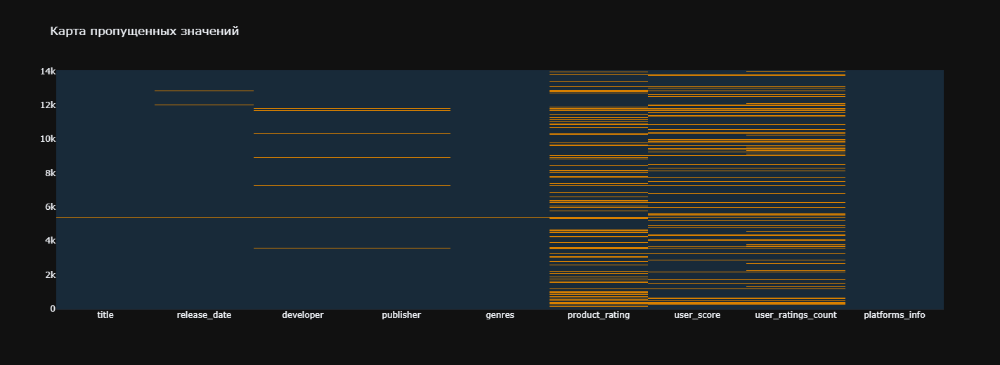

In [6]:
go.Figure(go.Heatmap(
    z=df.isna().astype(int), 
    x=df.columns, 
    showscale=False, 
    colorscale=['#182A39', '#D88000'])
         ).update_layout(
    height=520, 
    width=840, 
    title='Карта пропущенных значений', 
    template='plotly_dark').show()

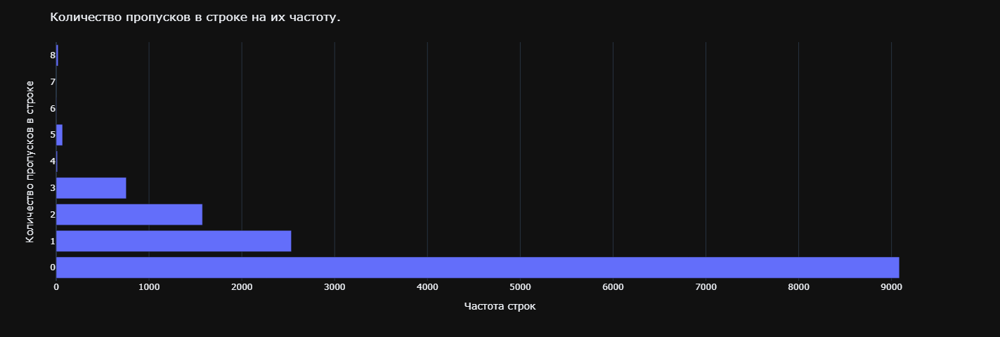

In [7]:
px.bar(
    df.isna().sum(axis=1).value_counts(),
    orientation='h').update_layout(  
    xaxis_title='Частота строк',
    yaxis_title='Количество пропусков в строке',
    height=480, 
    width=840, 
    showlegend=False,
    title='Количество пропусков в строке на их частоту.', 
    template='plotly_dark').show()

<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_На карте видно, что в наборе данных наблюдается малое количество строк, в которых пропущены почти все значения. График показывающий количество пропусков в строках говорит, что таких строк у нас **21(в них пропущено 8 значений из 9)**. Похоже, что дубликаты - это и есть те строки. Зато в целом и общем строк, в которых пустых значений нет совмем равно **9085**, что при размерности таблицы в **14055** достаточно неплохо. Также прослеживается некая закономерность пропусков у признаков **publisher, developer, product_rating, user_score, user_ratings_count**._
>
>_Найдём строки с самым большим количеством пропусков и посмотрим на них более детально._

</div>

In [8]:
# Сделаю копию и напишу функцию вывода строк с полным совпадением пропусков по каждому столбцу, где они есть. Выведу 3 случайных строки.
df1 = df.copy(); _nan_rows = lambda x: x.isna().sum().index[x.isna().sum().values > 0]
most_nans = df[df[_nan_rows].isna().all(1)]; display(most_nans.sample(3), f'{len(most_nans)} строка')

,title,release_date,developer,publisher,genres,product_rating,user_score,user_ratings_count,platforms_info
5577,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]
5582,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]
11212,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,[]


'21 строка'

<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_Оказывается, что признак **platforms_info** тоже имеет пропуски в виде значения `[]` . Нужно будет подробнее изучить строки имеющие подобное значение, но сначала избавимся от полностью пустых._

</div>

In [9]:
# Цикл будет удалять строки до тех пор, пока не удалит полное совпадение пропусков по каждому столбцу.
while len(df1[df1[_nan_rows].isna().all(1)]): df1 = df1[~df1[_nan_rows].isna().all(1)]

dup, min_pl, dlen = df1.duplicated().sum(), df1.iloc[:, -1].min(), len(df) - len(df1)
print(f'Дубликатов — {dup}, удалено строк — {dlen}. Cамая короткая информация platforms info: {min_pl}')

Дубликатов — 0, удалено строк — 24. Cамая короткая информация platforms info: []


<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_Благодаря циклу удалилось даже чуть больше строк, чем показывало изначально. Но строки со значением `[]` всё также наблюдаются в наборе данных._
>
>_Теперь после этой процедуры можно ещё дополнительно посмотреть корреляцию пропусков между всеми признаками._

</div>

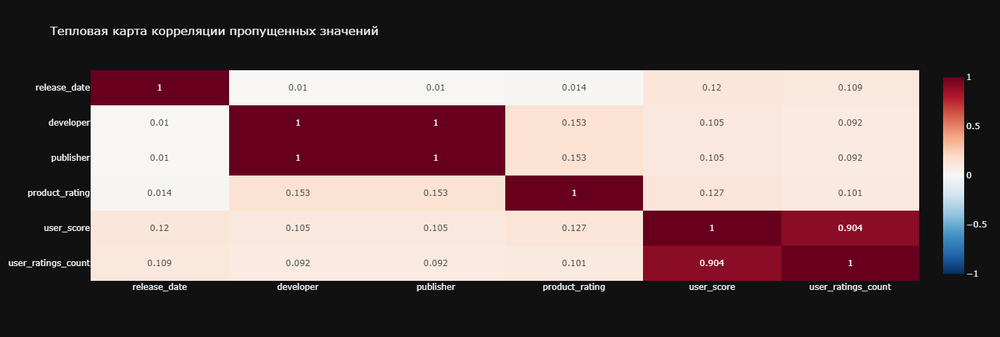

In [10]:
px.imshow(
    df1[_nan_rows].isna().corr().round(3), 
    text_auto=True, 
    height=480, 
    width=840, 
    color_continuous_midpoint=0,
    template='plotly_dark', 
    color_continuous_scale='RdBu_r', 
    aspect='auto', 
    title='Тепловая карта корреляции пропущенных значений').show()

<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_Наблюдается абсолютная корреляция между признаками **publisher - developer** и очень сильная у **user_score - user_ratings_count**. Это же можно было разглядеть и на карте пропущенных значений. По скольку доля пропущенных значений в этих столбцах мала и закономерна, то удалять как столбцы, так и строки мы не будем. К тому же EDA этого также не предусматривает. График сделан просто для дополнительной информации в последующих за EDA мероприятиями с набором данных._
>
>_Интересно посмотреть как обстоят дела со строками, где присутствует значение `[]` и отсутствует целевой признак._

</div>

In [11]:
no_score_rows = df1.query('platforms_info == "[]" & user_score.isna()')
print(no_score_rows.isna().mean(), f'\nстрок: {len(no_score_rows)}')

title                 0.000000
release_date          0.285714
developer             0.142857
publisher             0.142857
genres                0.000000
product_rating        0.428571
user_score            1.000000
user_ratings_count    1.000000
platforms_info        0.000000
dtype: float64 
строк: 7


<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_Таких строк оказалось **всего 7**, что совсем мало и это хорошо. Доли пропусков в остальных столбцах с этим значением тоже не критичны, если не считать **user_ratings_count**, который коррелирует с **user_score**. Всё таки в них может присутвсвовать полезная информация из других признаков, а значит оставим их пока так, как есть._
>
>_Хочу вытащить дополнительные данные из признака **platforms_info**. Из общей информации видно, что он содержит строку со списком, в котором содержится словарь. Значит нужно вытащить словарь и по ключам словаря сформировать новые признаки со значениями этих ключей внутри._

</div>

In [12]:
# Функция вытаскивет словарь из строки.
_dict_from_str = lambda x: eval(re.search(r'\{(.*?)\}', x).group()) if x != '[]' else x 

# Сделаю копию и пересоздам столбец с дополнительной информацией вытащив словарь.
df2 = df1.copy(); df2.iloc[:, -1] = df2.iloc[:, -1].apply(_dict_from_str); df2.iloc[:, -1][0]

{'Platform': 'iOS (iPhone/iPad)',
 'Platform Metascore': '83',
 'Platform Metascore Count': 'Based on 18 Critic Reviews'}

<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_Взяв первую строку из **platforms_info** видно, что в словаре содержится информация о платформе игры, количестве критиков на Metacritic оценивающих игру и общая средняя оценка._

</div>

In [13]:
# Функция соберёт значения словаря из platforms_info по каждому ключу, а также, где вместо ключа будет [] заменит его на NaN.
_platform_dict_values = lambda x, y: x.apply(lambda z: z[y] if z != '[]' else np.nan)
platform_dict_keys = list(df2.iloc[:, -1][0].keys()) # Ключи из словаря, будущие признаки.

# Вытаскиваю значения и на их основе формирую признаки. Создаю новую копию и удаляю ненужный теперь столбец 'platforms_info'.
df3 = df2.assign(
    metascore=_platform_dict_values(df2.iloc[:, -1], platform_dict_keys[1]),
    metascore_count=_platform_dict_values(df2.iloc[:, -1], platform_dict_keys[2]),
    platform=_platform_dict_values(df2.iloc[:, -1], platform_dict_keys[0])
                ).drop(columns = 'platforms_info').copy()

df3.iloc[:, -3:].head(1) # посмотрим результат на первой строке с новыми столбцами.

,metascore,metascore_count,platform
0,83,Based on 18 Critic Reviews,iOS (iPhone/iPad)


<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_Всё получилось, но предстоит поработать ещё с каждым столбцом отдельно. Начнём с **platform**. Посмотрим на уникальные значения, возможно найдутся невалидные значения либо опечатки._

</div>

In [14]:
print(df3['platform'].unique()) # посмотрим уникальные значения о платформах игр

['iOS (iPhone/iPad)' 'Xbox' 'PlayStation 2' 'PC' 'Wii' 'PSP'
 'PlayStation 4' 'GameCube' 'Nintendo Switch' 'PlayStation Vita'
 'PlayStation 5' 'PlayStation 3' 'Xbox One' '3DS' 'Xbox 360' 'DS'
 'Game Boy Advance' 'PlayStation' 'Nintendo 64' 'Dreamcast'
 'Xbox Series X' 'Wii U' nan 'Meta Quest']


<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_Опечаток и невалидных значений незамечено. Зато появилась идея объединить их более общие группы семейств. Платформы, не попавшие ни в одно семейство объединим в **"Другие"** вместе с неизвестными значениями. Всё это позволит уменьшить количество категорий в данном признаке, что возможно даст нам полезную информацию._

</div>

In [15]:
# Функция которая позволит создать более обощённые категории по признаку 'platform'.
_regroup_platform = lambda x: (
    'Nintendo' if x in ['Game Boy Advance', 'Wii U', 'Nintendo Switch', 'Nintendo 64', 'Wii', '3DS', 'GameCube', 'DS'] else 
    x[:4] if x.startswith('Xbox') else
    'Others(Sega, Meta, Unknown)' if x in ('nan', 'Meta Quest', 'Dreamcast') else 
    'PlayStation' if x.startswith('PlayStation') or x == 'PSP' else x)

In [16]:
# Сделаю копию и перезапишу столбец 'platform' применив к нему функцию созданную ранее.
df4 = df3.copy(); df4['platform'] = df4['platform'].apply(lambda x: _regroup_platform(str(x))); print(df4['platform'].unique())

['iOS (iPhone/iPad)' 'Xbox' 'PlayStation' 'PC' 'Nintendo'
 'Others(Sega, Meta, Unknown)']


<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_Всё получилось, как и задумывалось. Теперь посмотрим, как обработался столбец со средней оценкой критиков. Возможно мы найдём не только числовые значения. Поскольку в нём присутствуют пропуски, то как минимум это должно проявиться._

</div>

In [17]:
# С помощью цикла проверим есть ли значения в признаке 'metascore', которые не являются числами как таковыми.
for i in df4['metascore'].unique():
    try: int(i) 
    except: print(i)

tbd
nan


<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_И действительно, помимо пустого значения отобразилось ещё и такое значение, как `tbd`(**To Be Determined**) — в переводе с английского означает "еще предстоит определить". Это рейтинг, который указывает на то, что игра еще не получила достаточного количества оценок от критиков для определения её окончательной оценки._
>
>_Посмотрим на долю пропусков в остальных столбцах, где отсутсвтсует средняя оценка пользователя, а также имеется подобное значение._

</div>

In [18]:
tbd_rows = df4.query('metascore == "tbd" & user_score.isna()'); print(tbd_rows.isna().mean(), f'\nстрок: {len(tbd_rows)}')

title                 0.000000
release_date          0.006098
developer             0.012195
publisher             0.012195
genres                0.000000
product_rating        0.176829
user_score            1.000000
user_ratings_count    1.000000
metascore             0.000000
metascore_count       0.000000
platform              0.000000
dtype: float64 
строк: 164


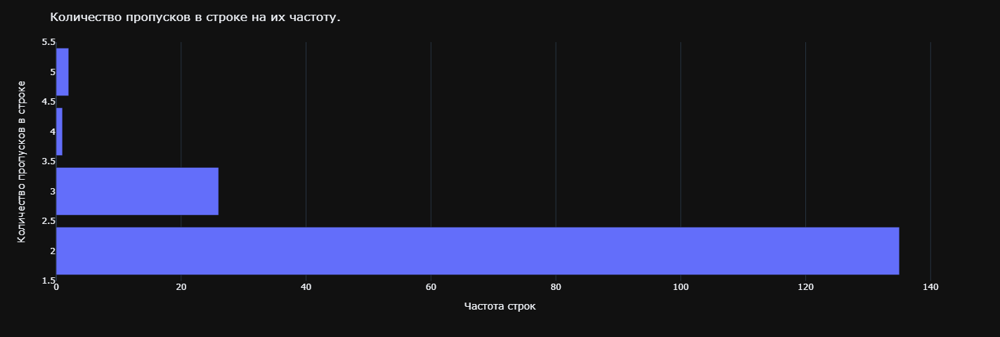

In [19]:
px.bar(
    tbd_rows.isna().sum(axis=1).value_counts(),
    orientation='h').update_layout(
    xaxis_title='Частота строк',
    yaxis_title='Количество пропусков в строке',
    height=480, 
    width=840, 
    showlegend=False,
    title='Количество пропусков в строке на их частоту.', 
    template='plotly_dark').show()

<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_Получилось **164 строки**, что не так уж и мало, но в остальном здесь та же история, что и со значением `[]` у признака **platforms_info**. В сумме на графике насчитал всего лишь **3 строки**, где наблюдается **от 4 до 5 пропусков(меньше 50%)**. Значит никаких манипулящий, кроме замены `tbd` пустым значенимем, а остальных в тип **int** не потребуется._
>
>_После этого останется только поработать со столбцом **metascore_count**. Сейчас вместо значения числа критиков в нём находятся строки, из которых мы будем извлекать число и переведём в тип **int**._
>
>_И в завершении этого этапа вытащим год из даты релиза, чтобы снизить количество значений в этом признаке и в последующем, возможно, найти какие-нибудь интересные взаимосвязи и закономерности во времени. А затем сравним результаты предобработки с исходным набором данных._

</div>

In [20]:
# Создаю копию и произвожу последние манипуляции с оставшимися признаками.
df5 = df4.copy(); df5.insert(2, 'year', pd.to_datetime(df5['release_date']).dt.year.astype('Int64'))

df5['metascore_count'] = df5.iloc[:, -2].apply(lambda x: int(x.split(' ')[2]) if x is not np.nan else x)

df5['metascore'] = df5['metascore'].apply(lambda x: int(x) if x not in ['tbd', np.nan] else np.nan) 

df5 = df5.drop(columns='release_date') #Удаляю столбец 'release_date'.

# Проверяю, что всё отработало как надо.
for col in ['metascore', 'metascore_count', 'year']: print(df5[col].unique(), df5[col].dtype, '\n')

[83. 59. 78. 63. 69. 86. 65. 82. 70. 77. 54. 74. 60. 61. 72. 85. 89. 80.
 44. 88. 76. 67. nan 73. 62. 30. 75. 79. 68. 92. 84. 87. 90. 96. 71. 39.
 57. 81. 51. 40. 41. 93. 50. 66. 64. 53. 37. 49. 91. 56. 46. 55. 33. 43.
 31. 48. 95. 58. 52. 42. 47. 45. 97. 94. 34. 32. 36. 38. 28. 24. 20. 29.
 35. 26. 17. 25. 18. 13. 98. 99. 21. 19. 23. 27. 16. 11. 22.] float64 

[ 18.  15.  39.  12.  36.  29.  10.  23.   8.  34.  45.  17.   6.   5.
  55.  14.  28.   2.   7.  26.  11.  43.  50.  22.  38.  52.  20.   9.
  51.  27.  19.  82.  32.  24.  47.   4.   1.  30.  21.  31. 110.  69.
  13.  70.  42.   3.  16.  86.  35.  56.  62.  61.  44.  40.  68.  76.
  37.  79.  33.  53.  49.  63.  57.  41.  87.  25.  85.  74.  73.  60.
  77.  48.  46.  88. 122.  54.  83.  89.  99.  65. 119.  75.  71. 139.
  72. 123. 100.  66.  90.  59. 108.  80.  92. 107. 129.  81.  64.  58.
  91.  98. 103. 127.  78.  97.  94.  67. 125. 131.  95.  84.  96. 106.
 112. 126. 117.  93. 121.  nan 104. 124. 115. 111. 105. 101. 149. 11

In [21]:
row, col =  df5.shape
dup, unq = df5.duplicated().sum(), df5.nunique()
type, nans, nanper = df5.dtypes, df5.isna().sum(), round(df5.isna().mean(), 3)

info = pd.concat(
    [type, nans, nanper, unq], axis=1, keys=['Тип данных', 'Пропуски', 'Доля', 'Уник.значений'])

result = f'Итоговая таблица: \n\n{info}\n\n' \
         f'Дубликатов: {dup}; Размеры: строк — {row}, столбцов — {col}\n{"-" * 60}'

print(preset, result)

Изначальная таблица — Video_games:

                   Тип данных  Пропуски   Доля  Уник.значений
Title                  object        21  0.001          14034
Release Date           object        64  0.005           4752
Developer              object       138  0.010           4449
Publisher              object       138  0.010           2307
Genres                 object        21  0.001            119
Product Rating         object      3050  0.217              6
User Score            float64      2341  0.167             96
User Ratings Count    float64      2756  0.196           1237
Platforms Info         object         0  0.000          11956

Дубликатов: 21; Размеры: строк — 14055, столбцов — 9
------------------------------------------------------------
 Итоговая таблица: 

                   Тип данных  Пропуски   Доля  Уник.значений
title                  object         0  0.000          14031
year                    Int64        40  0.003             30
developer             

<div style="background-color:#182A39; color:#00BFDD; padding:5px">

<div style="background-color:#1A2331; padding:10px"; align="center">

## [<span style="color:#E28200">___2. Описательная статистика переменных___<span>](#Разведочный-анализ-данных-видеоигр-на-сайте-Metacritic)</br>

</div>

<br>
    
>_Для количественных признаков посмотрим на гистограммы, а также боксплоты для более наглядного выявления выбросов, и такие основные показатели, как среднее, медиана, перцентили и стандартное отколонение._
>
>_Для категориальных же посмотрим барплоты и там, где количество категорий в признаке больше десяти посмотрим топ 10 самых крупных категорий, а также на самые частовстречаемые значения в каждой переменной и их количество._
>
>_Начнём с количественных признаков. Боксплоты визуализируем как есть, но в гистограммах сами значения заранее разобьём на интервалы, чтобы получить более чёткие и ровные формы распределения._

</br>

---
</div>

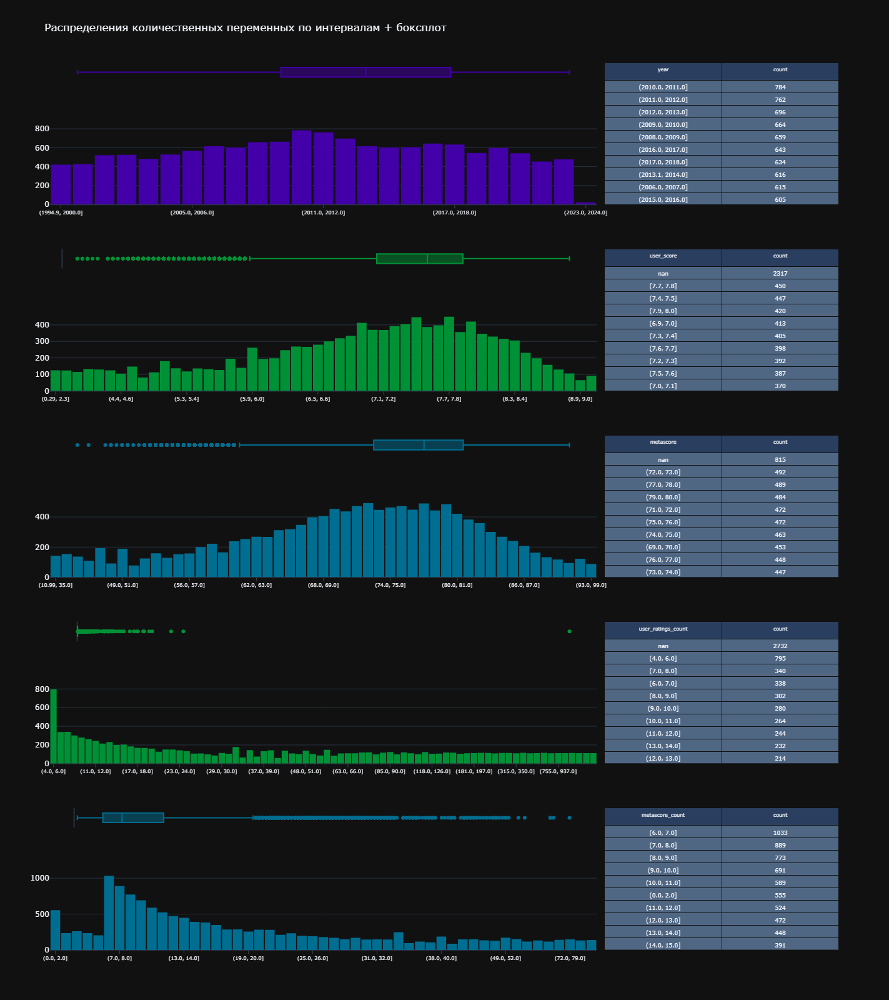

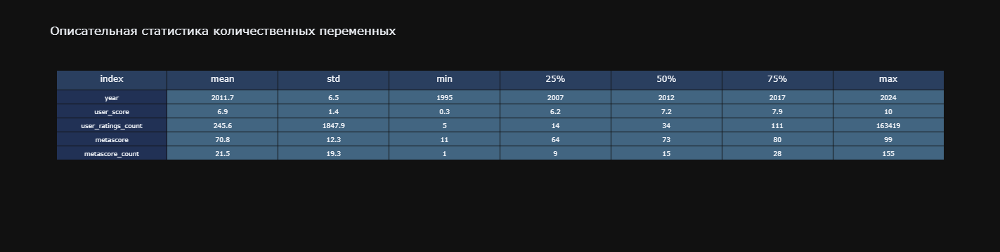

In [22]:
qualitative = df5.select_dtypes(exclude=['object']).copy() 
qual_cols, row = ['year', 'user_score', 'metascore', 'user_ratings_count', 'metascore_count'], 1

qual_fig = make_subplots(
    rows=10, 
    cols=2, 
    horizontal_spacing=0.01, 
    vertical_spacing=0.05, 
    column_widths=[0.7, 0.3], 
    row_heights = [0.2, 0.8] * 5, 
    specs=[[{}, dict(rowspan=2, type='table')], [{}, None]] * 5)  

for n, i in enumerate(qual_cols, 1):
    
    qual_qbins = pd.qcut(qualitative[i], 100, duplicates='drop', precision=2 if n in(2, 3) else 0).sort_values()    
    qual_vals = qual_qbins.value_counts(dropna=False); qual_qbins = qual_qbins.dropna()
   
    qual_fig.add_box(marker_color='#4300A9' if row == 1 else '#009137' if row in(3, 7) else '#006E91', 
                     x=qualitative[i], name='', row=row, col=1)
   
    qual_fig.update_xaxes(showticklabels=False, row=row, col=1).for_each_xaxis(lambda x: x.update(showgrid=False))
    
    qual_fig.add_table(header=dict(values=[i, qual_vals.name], font_size=8), 
                       cells=dict(values=[qual_vals.index.astype('str'), qual_vals.values], font_size=9), row=row, col=2)

    qual_fig.add_histogram(marker_color='#4300A9' if row + 1 == 2 else '#009137' if row + 1 in(4, 8) else '#006E91',
                           name=i, x=qual_qbins.astype('str'), row=row + 1, col=1)

    qual_fig.update_xaxes(tickfont_size=8, dtick = 6, ticks='outside', row=row + 1, col=1); row += 2
        
qual_fig.update_layout(height=1600, 
                       width=980, 
                       bargap=0.1, 
                       showlegend=False, 
                       template='plotly_dark',
                       title_text='Распределения количественных переменных по интервалам + боксплот').show()

qual_describe = qualitative.describe().iloc[1:].round(1).T.reset_index()

qual_desc_fig = go.Figure(go.Table(header=dict(values=qual_describe.columns), 
                                   cells=dict(values=qual_describe.values.T, font_size=9, fill_color=['#213155','#426581'])))

qual_desc_fig.update_layout(title_text='Описательная статистика количественных переменных',
                            height=320, width=940, template='plotly_dark').show()

<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
___Из особенностей выделю следующее :___ 

- _Формы распределения признаков **user_score и metascore** крайне похожи. Это косвенно говорит о том, что мнение пользователей в целом схоже с мнением пользователей ;_
- _У признаков **user_ratings_count и metascore_count** почти тоже самое, плюс распределения смещены к началу. В основной массе игры получают не так много оценок от критиков и пользователей ;_
- _На боксплоте у переменной **user_ratings_count** также ярко выделяется игра имеющая **163419 голосов** пользователей._

>_Всё остальное можно увидеть в таблице описательной статистики. Теперь посмотрим на категориальные признаки._

</div>

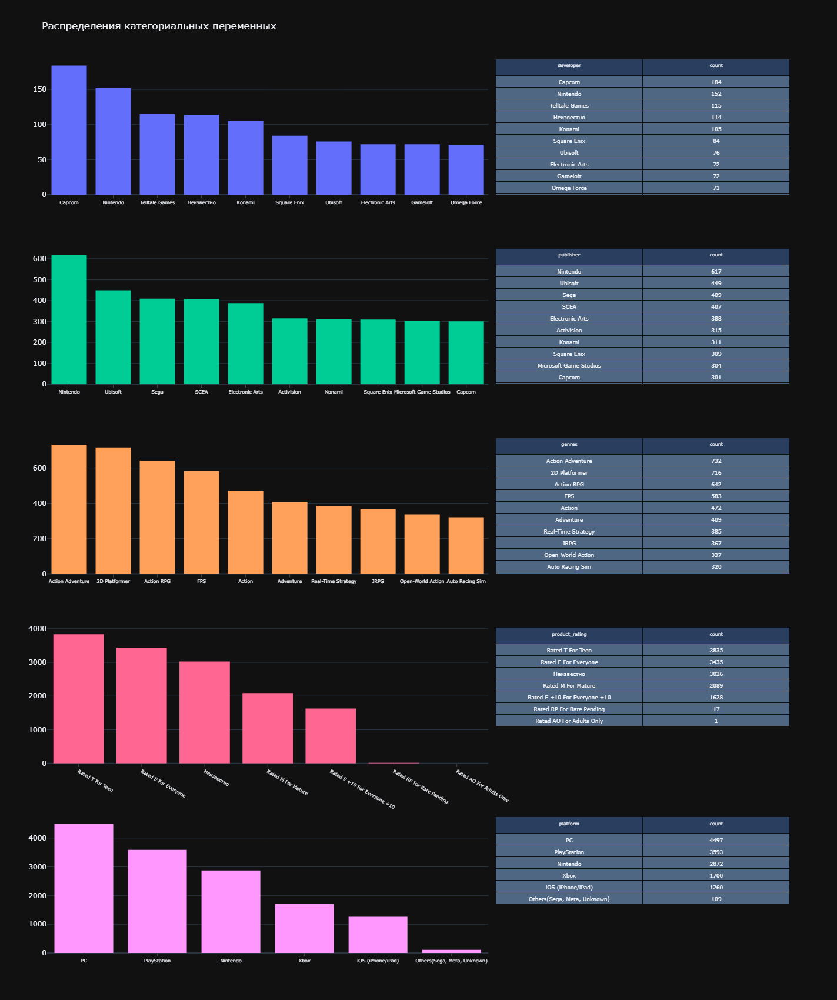

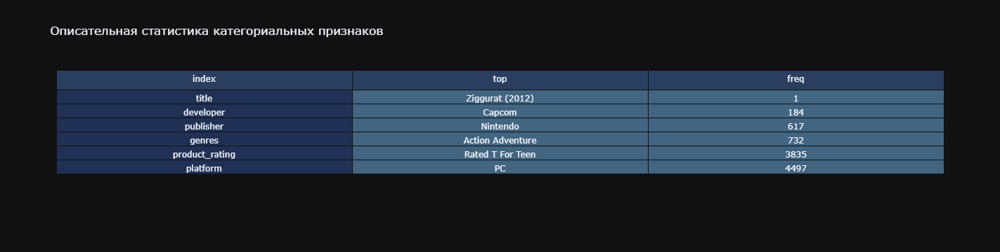

In [23]:
categorical = df5.select_dtypes(include=['object']).fillna('Неизвестно').copy()
cat_cols = categorical.columns[1:]; cc_len = len(cat_cols)

cat_fig = make_subplots(rows=cc_len,
                        cols=2, 
                        horizontal_spacing=0.01, 
                        column_widths=[0.6, 0.4], 
                        vertical_spacing=0.06,
                        specs=[[{}, dict(type='table')]] * cc_len)

for n, i in enumerate(cat_cols, 1):
    cat_top = categorical[i].value_counts(); cat_top20 = cat_top.index[:10]
    cat = categorical.query(f'{i} in @cat_top20')[i] if n in (1, 2, 3) else categorical[i] 
   
    cat_fig.add_histogram(name=i, x=cat, row=n, col=1).update_xaxes(tickfont_size=8, ticks='outside', 
                                                                    categoryarray=cat_top.index, row=n, col=1) 
    
    cat_fig.add_table(header=dict(values=[i, cat_top.name], font_size=8), 
                      cells=dict(values=[cat_top.index, cat_top.values], font_size=9), row=n, col=2)
     
cat_fig.update_layout(height=1700, 
                      width=980, 
                      showlegend=False, 
                      template='plotly_dark',
                      title_text='Распределения категориальных переменных').show()

cat_describe = categorical.describe().iloc[2:].T.reset_index()

cat_desc_fig = go.Figure(go.Table(header=dict(values=cat_describe.columns), 
                                  cells=dict(values=cat_describe.values.T, fill_color=['#213155','#426581'])))

cat_desc_fig.update_layout(title_text='Описательная статистика категориальных признаков',
                           height=340, width=640, template='plotly_dark').show()

<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_Здесь чего то интересного я не заметил, всё достаточно стандартно в контексте игр и не выбивается из этой логики. Переменные мы описали, можно переходить к следующему этапу._

</div>

<div style="background-color:#182A39; color:#00BFDD; padding:5px">

<div style="background-color:#1A2331; padding:10px"; align="center">

## [<span style="color:#E28200">___3. Целевой признак и взаимосвязи с ним___<span>](#Разведочный-анализ-данных-видеоигр-на-сайте-Metacritic)</br>

</div>

<br>
    
>_Начнём изучение с выявления линейной корреляции. Изобразим её с помощью таких графиков, как тепловая карта и матрицы диаграмм рассеяния. Важно знать, что номинативные переменные не отобразят линейную связь на тепловой карте, а на диаграмме, учитывая количество категорий, будут выглядеть неинформативно. Поэтому учитывать их не будем. Также помня, что у признака **user_score** есть крайне выбивающиеся значения, создадим переменную с логарифмированными значениями. Это нужно для того, чтобы разглядеть корреляцию, если она есть, более точно. Также будем учитывать только те данные, где нету пропусков по целевому признаку для большей точности._
>
>_Далее посмотрим уже силу взаимосязи между всеми признаками. Это позволит выявить нелинейные связи между целевым признаком и остальными переменными. Делать мы это будем с помощью библиотеки **phik** и отобразим на тепловой карте. При этом отобразить связь между всеми признаками не получится, так как есть определённые ограничения на количество уникальных значений в переменной._
>
>_Затем выведем самые сильные взаимосвязи и покажем их более детально._

</br>

---
</div>

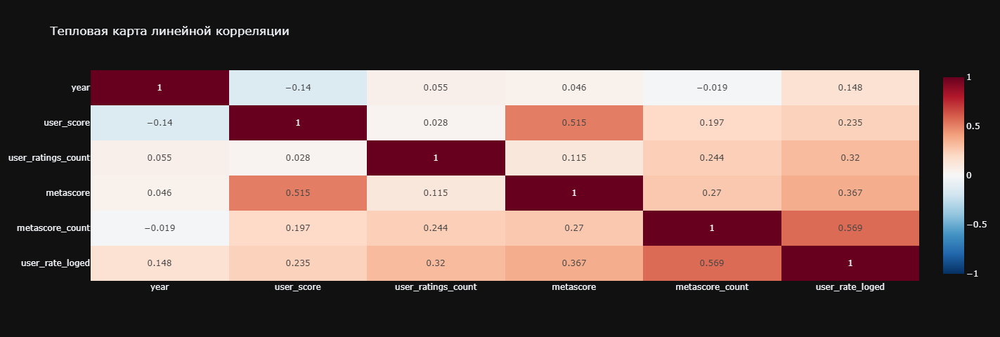

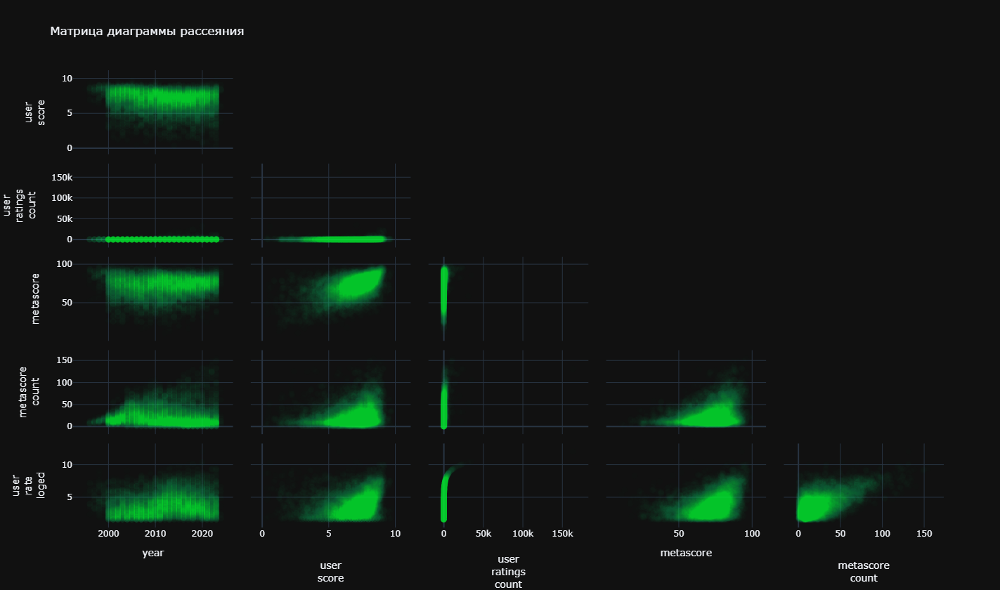

In [24]:
qualitative1 = qualitative.dropna(subset='user_score').copy()
qualitative1['user_rate_loged'] = qualitative1.iloc[:, 2].apply(np.log)

qual_labels = {col:col.replace('_', '<br>') for col in qualitative1.columns}

px.imshow(qualitative1.corr().round(3), 
          text_auto=True,
          labels=qual_labels, 
          color_continuous_scale='RdBu_r',
          height=480,
          width=920, 
          template='plotly_dark', 
          aspect='auto', 
          color_continuous_midpoint=0,
          title='Тепловая карта линейной корреляции').show()

score_full_scatter = px.scatter_matrix(qualitative1,
                                       labels=qual_labels,
                                       height=840, 
                                       width=840, 
                                       template='plotly_dark',
                                       title='Матрица диаграммы рассеяния')

score_full_scatter.update_traces(showupperhalf=False, diagonal_visible=False, 
                                 marker=dict(color='rgba(0, 255, 100, 0.01)', size=9))

<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_Наблюдается сильная линейная положительная корреляци между **user_score и metascore** и такая же, но уже малозаметная к переменным **user_ratings_count**(логарифмированному) и **metascore_count**._
>
>_Теперь посмотрим уже на силу взаимосвязи всех подходящих по количеству униклальных значений признаков._

</div>

interval columns not set, guessing: ['year', 'user_score', 'user_ratings_count', 'metascore', 'metascore_count']


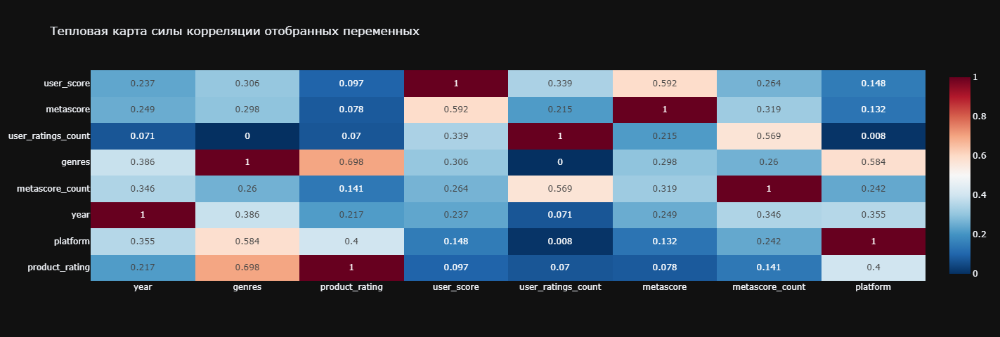

In [25]:
# Функция отбирает переменные, у которых уникальных значений меньше определённого порога.
_few_uniqs = lambda x: list(x.nunique().index[x.nunique().values <= 2000])

phik_overview = (df5.dropna(subset='user_score')[_few_uniqs(df5)]
                    .query('user_ratings_count != 163419') #Решил убрать самое экстремальное значение.
                    .phik_matrix().sort_values('user_score', ascending=False))

px.imshow(phik_overview.round(3), 
          text_auto=True, 
          labels=qual_labels, 
          height=480, width=840, 
          template='plotly_dark',
          aspect='auto', 
          color_continuous_scale='RdBu_r',
          title='Тепловая карта силы корреляции отобранных переменных').show()

<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_Помимо уже представленных до этого линейных взаимосвязей, сейчас мы смогли также задетектировать небольшую нелинейную связь между **genres и user_score**. Это говорит о том, что в определённые жанры получают более высокие оценки._
>
>_Теперь возьмём несколько самых сильных по корреляции признаков и покажем более детально. Количественные признаки разобьём по интервалам, чтобы лучше показать линейную взаимосвязь._

</div>

In [26]:
def _corr_target_plot(data, x, y):
  
    data = data[[x, y]].dropna()
    bined_y = pd.qcut(data[y], 10, precision=0) if data[y].dtype != 'O' else data[y]
    df = data.groupby(bined_y, observed=True)[x].agg(['count', 'mean']).round(2) 
    df = df.nlargest(10, 'count').sort_values('mean', ascending=False) if data[y].dtype == 'O' else df
    
    fig = make_subplots(rows=1, cols=2, horizontal_spacing=0.01, specs=[[{}, dict(type='table')]])
    fig.add_scatter(x=df.index.astype(str), y=df['mean'], row=1, col=1)
    fig.update_xaxes(tickfont_size=8, ticks='outside', row=1, col=1)     
    
    fig.add_table(header=dict(values=[df.index.name, 'count', 'mean'], font_size=10), 
                  cells=dict(values=[df.index.astype(str), df['count'], df['mean']], font_size=9), row=1, col=2)
    
    return fig.update_layout(height=420, width=920, template='plotly_dark', 
                             title_text=f'Взаимосвязь {x} и {y}').show()

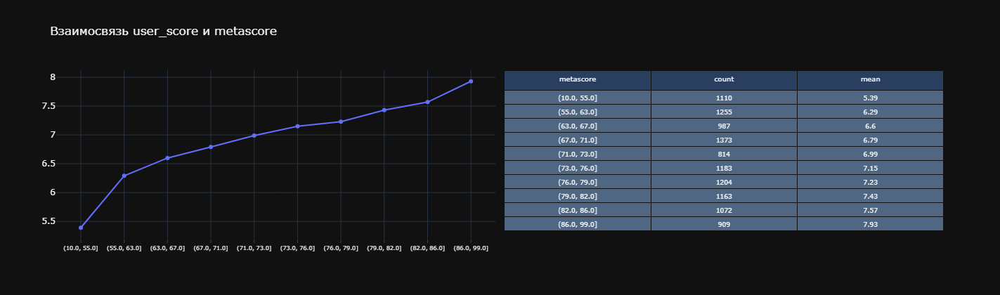

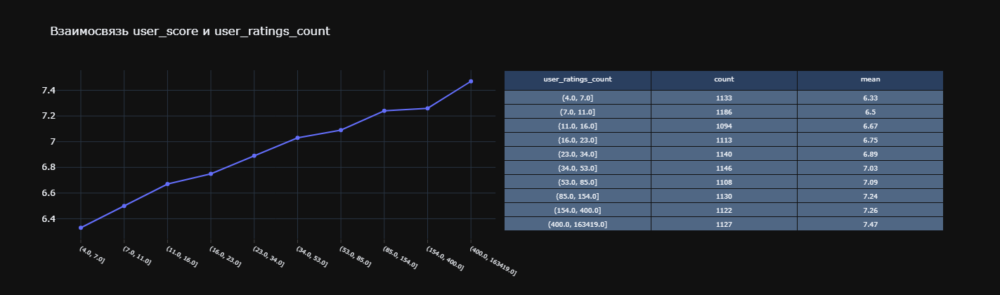

In [27]:
_corr_target_plot(df5, 'user_score', 'metascore')
_corr_target_plot(df5, 'user_score', 'user_ratings_count')

<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_Линейная корреляция очевидна. Теперь посмотрим какие жанры имеют наибольшую среднюю оценку. Добавим к линейному графику ещё и боксплоты для большей информативности. Также возьмём топ 10 жанров по количеству игр, чтобы уменьшить фактор случайности._

</div>

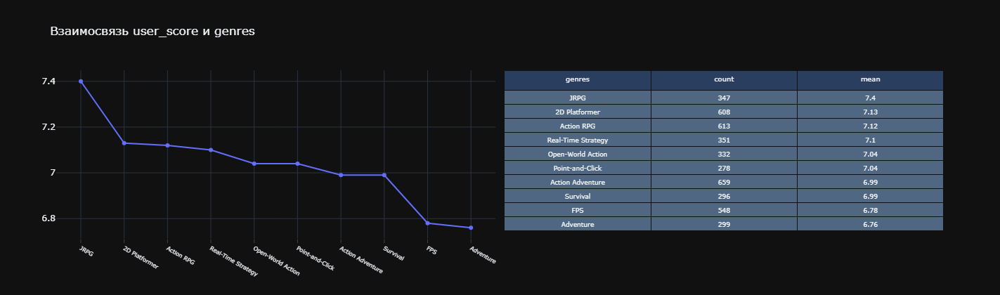

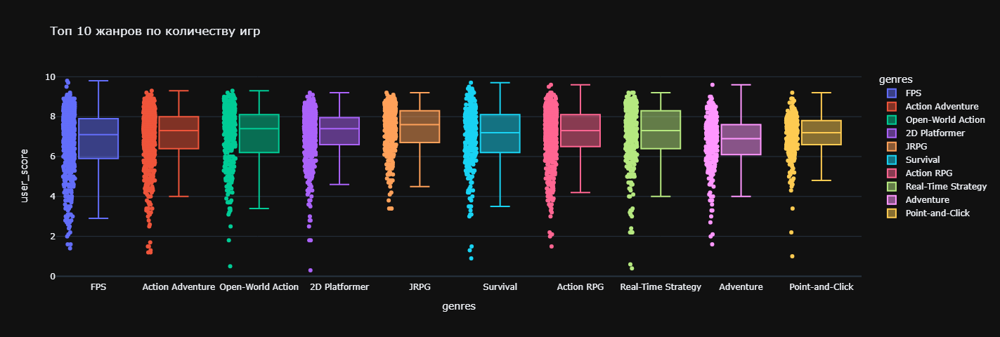

In [28]:
_corr_target_plot(df5, 'user_score', 'genres')

best_genres = df5.dropna(subset='user_score')['genres'].value_counts().head(10).index
px.box(df5.query('genres in @best_genres'), 
       x='genres', 
       y='user_score', 
       points='all', 
       color='genres', 
       height=480, 
       width=840, 
       template='plotly_dark',
       title='Топ 10 жанров по количеству игр')

<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_Теперь посмотрим как будет изменяться средня оценка у отобранных жанров в зависимости средней оценки metascore и количества оценок пользователей. Изобразим данные на тепловой карте по каждому жанру отдельно._

</div>

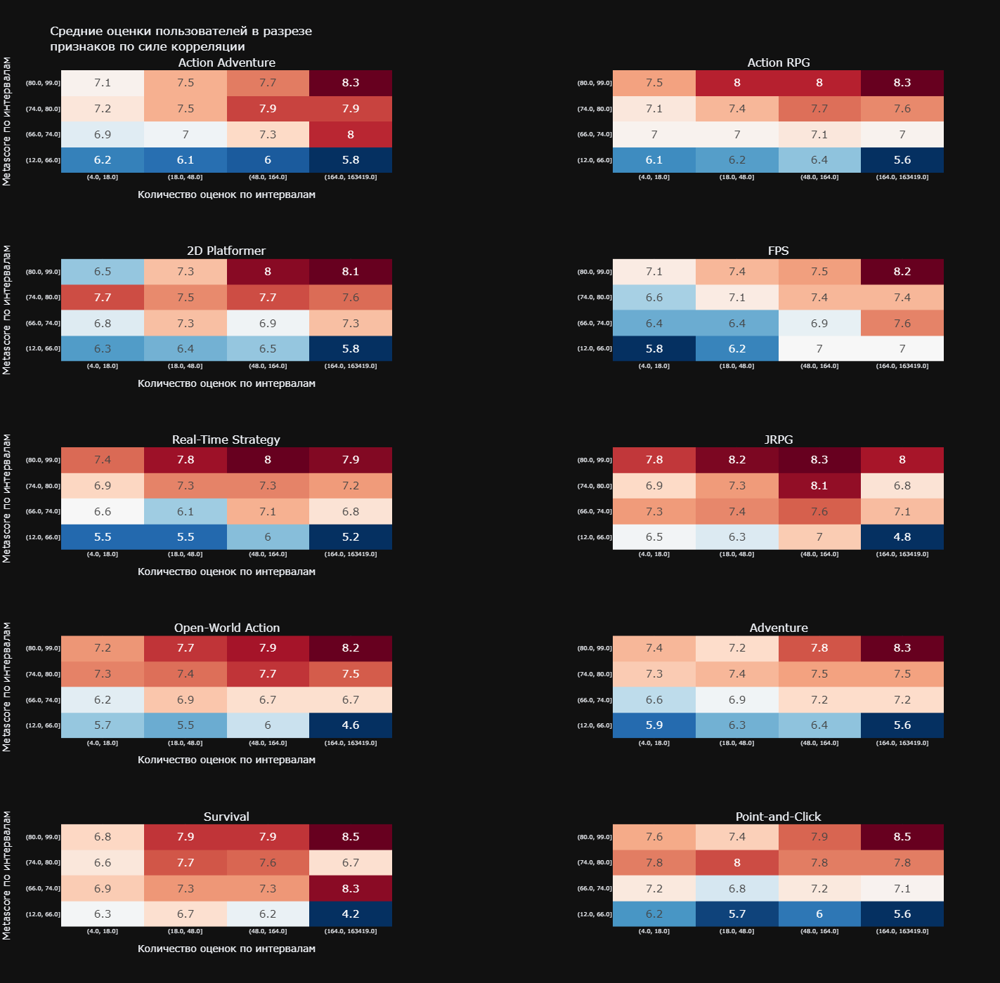

In [29]:
strong_relations = df5.dropna(subset=df5.columns[7:10]).query('genres in @best_genres').copy()
strong_relations['bined_ratings_count'] = pd.qcut(strong_relations['user_ratings_count'], 4, precision=0)
strong_relations['bined_metascore'] = pd.qcut(strong_relations['metascore'], 4, precision=0)

genre_score_heatmap = make_subplots(rows=5, 
                                    cols=2, 
                                    horizontal_spacing=0.25,                                        
                                    subplot_titles=(best_genres), 
                                    specs=[[{}, {}]] * 5)

row = 0; title_heatmap = 'Средние оценки пользователей в разрезе<br>признаков по силе корреляции'

for n, d in enumerate(strong_relations.groupby('genres'), 1):
    d = (pd.pivot_table(d[1].query('genres in @best_genres'), 
                        index = 'bined_ratings_count',
                        columns = 'bined_metascore', 
                        values = 'user_score', 
                        aggfunc = 'mean').round(1)).T

    d.index, d.columns = d.index.astype(str), d.columns.astype(str)
    row, col  = row + 1 if n % 2 else row + 0, 1 if n % 2 else 2    
    
    genre_score_heatmap.add_heatmap(z=d, 
                                    x=d.columns,
                                    y=d.index, 
                                    text = d.values, 
                                    texttemplate="%{text}", 
                                    textfont={"size":15}, 
                                    colorscale='RdBu_r', 
                                    showscale=False,
                                    row=row, 
                                    col=col)

    genre_score_heatmap.update_xaxes(title_text='Количество оценок по интервалам' if col == 1 else None, 
                                     tickfont_size=8, row=row, col=col)

    genre_score_heatmap.update_yaxes(title_text='Metascore по интервалам' if col == 1 else None,
                                     tickfont_size=8, row=row, col=col)   

genre_score_heatmap.update_layout(height=1400, width=700, template='plotly_dark', title=title_heatmap).show()

<div style="background-color:#008C4A; padding:5px">

<div style="background-color:#007537; color:#202020; padding:10px">
    
>_И бонусом ещё хотелось определить топ самых лучших игр, проставив ранги признакам **user_score, user_ratings_count и metascore**. Затем проссумируя их по каждой строке получим общий ранг и выведем топ 10 игр._

</div>

In [30]:
def _best_games(data, columns_list, titles):
    df = data.dropna(subset=columns_list).copy()
    
    for num, col in enumerate(columns_list, 1):
        df[f'{num}'] = df[col].rank(method='dense') 

    df['total'] = df.iloc[:, -3:].sum(axis=1)
    index = df['total'].nlargest(10).index
    df = df.query('index in @index').sort_values('total', ascending=False).iloc[:, :-4]
    qual = df.describe(exclude=['object']).iloc[1:].round(1)
    cat = df.describe(include=['object']).iloc[1:]; tables = (df, cat, qual)

    fig = make_subplots(rows=2, 
                        cols=2, 
                        row_heights = [0.6, 0.4], 
                        column_widths=[0.4, 0.6],
                        horizontal_spacing=0.01, 
                        vertical_spacing=0.05, 
                        subplot_titles=(titles),
                        specs=[[dict(type='table', colspan=2), None], [dict(type='table')] * 2])

    for n, t in enumerate(tables, 1): 
        t = t.T.reset_index()
        fig.add_table(header=dict(values=None if n == 1 else t.columns, font_size=10), 
                      cells=dict(values=t.values.T, font_size=9, fill_color=['#213155','#426581']), 
                      
                      row=n if n < 3 else 2, col=1 if n < 3 else 2)
    
    return fig.update_layout(height=800, width=1500, template='plotly_dark').show()

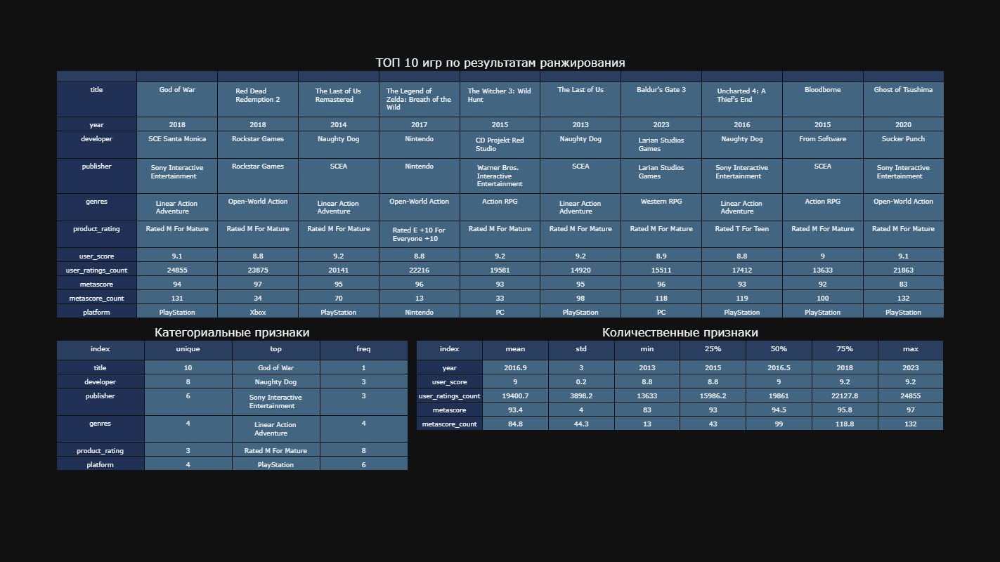

In [31]:
_best_games(df5, df5.columns[6:9], ['ТОП 10 игр по результатам ранжирования', 'Категориальные признаки', 'Количественные признаки'])